# Preprocessing: Pipeline Setup
* Grayscale morphology: markers and masks
* Grayscale morphology: H-domes

In [1]:
using Pkg
Pkg.activate("calval")
Pkg.add(;name="IceFloeTracker", rev="main") # potentially lets me use the dev version!
using Images
using IceFloeTracker
using CSV
# Pkg.add("CairoMakie")
using CairoMakie
using DataFrames
using Peaks

  Activating project at `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval`
    Updating git-repo `https://github.com/WilhelmusLab/IceFloeTracker.jl.git`
   Resolving package versions...
  No Changes to `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Project.toml`
  No Changes to `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Manifest.toml`


In [2]:
Pkg.resolve()

  No Changes to `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Project.toml`
  No Changes to `~/Documents/research/manuscripts/cal-val_ice_floe_tracker/calval_tgrs/notebooks/calval/Manifest.toml`


# To do:
* Move segmentation stuff out of here
* Verify the preprocessing quality against validation images

# Parameters and cloud mask

In [8]:
using IceFloeTracker: nonlinear_diffusion, Watkins2025CloudMask
using IceFloeTracker.Filtering: PeronaMalikDiffusion
using IceFloeTracker: fill_holes
using StatsBase

In [350]:
cloud_mask_settings = (
    prelim_threshold=53.0/255.,
    band_7_threshold=130.0/255.,
    band_2_threshold=169.0/255.,
    ratio_lower=0.0,
    ratio_offset=0.0,
    ratio_upper=0.53
)

la2019_cmask = LopezAcostaCloudMask(cloud_mask_settings...)
new_cmask = Watkins2025CloudMask();

Preprocessing
* The goal is to make a version of the image that has sharper boundaries without making the floe interior too noisy.
* We have the option to remove the clouds now or later, I'm considering doing this later in the segmentation steps
* Filtering tiles based just on whether any ocean pixels are present after dilating the land mask.

In [363]:

for case_number in [10, 81, 104,  128]#[6, 11, 15, 43, 63, 67, 95, 168]
    data_loader = Watkins2025GitHub(; ref="1d36f82a5cb337839ab039bffca8961a97241c22")
    dataset = data_loader(c -> c.case_number == case_number && c.satellite == "aqua");
    case = first(dataset);
    pmd_diff = PeronaMalikDiffusion(0.1, 0.1, 5, "exponential")
    
    tc_img = RGB.(case.modis_truecolor)
    fc_img = RGB.(case.modis_falsecolor)
    
    land_mask = IceFloeTracker.create_landmask(case.modis_landmask, strel_diamond((3,3)))
    cloud_mask = IceFloeTracker.create_cloudmask(fc_img, new_cmask)
    
    tile_size_pixels = 200
    minimum_ocean_pixels = 100^2 # setting for the simple tile filter
    
    tiles = IceFloeTracker.get_tiles(tc_img, tile_size_pixels)
    
    # Get list of tiles to process:
    # just use a minimum value for land for now
    filtered_tiles = filter(
        t -> sum(.!land_mask.dilated[t...]) > minimum_ocean_pixels, tiles)
    
    @info "Diffuse and sharpen the full image"
    # Image diffusion can be slow, so applying it only to the tiles in the filtered list
    # speeds things up linearly (i.e. half the number of tiles takes half as long.)
    # This does slightly change the result, as borders of tiles are not diffused.
    tc_diffused_sharpened = deepcopy(tc_img)
    @time begin
        for tile in filtered_tiles
            tc_diffused_sharpened[tile...] .= nonlinear_diffusion(deepcopy(tc_img)[tile...], pmd_diff) |> IceFloeTracker.unsharp_mask
            # Could have this here.
            # Alternatively, select tiles with bright clouds, and do a rolling mean of the two to smooth boundaries.
        end
    end
    
    @info "Histogram adjustment"
    # Things to prevent issues: the rblocks and cblocks not result in cutting the image into too small of pieces.
    # 50 km - 100 km block seems okay. Done on the whole image as the algorithm is rather fast.
    rblocks, cblocks = round.(Int64, size(tc_img) ./ tile_size_pixels)
    rblocks = maximum((1, rblocks))
    cblocks = maximum((1, cblocks))
    # Q1: Do we have better results with or without AdaptiveEqualization?
    @time adjust_histogram!(tc_diffused_sharpened, AdaptiveEqualization(clip=0.99, rblocks=rblocks, cblocks=cblocks, nbins=256))
    
    cloudy_tiles_mask = zeros(size(tc_diffused_sharpened))
    for tile in filtered_tiles
        if mean(cloud_mask[tile...]) > 0.75
            cloudy_tiles_mask[tile...] .= mean(cloud_mask[tile...])
        end
    end
    aggressive_equalization = adjust_histogram(tc_diffused_sharpened, AdaptiveEqualization(clip=0.75, rblocks=rblocks, cblocks=rblocks, nbins=256))
    tc_diffused_sharpened = (ones(size(tc_diffused_sharpened)) .- cloudy_tiles_mask) .* tc_diffused_sharpened .+ cloudy_tiles_mask .* aggressive_equalization
    
    @info "Contrast stretching"
    enhanced_gray = Gray.(tc_diffused_sharpened) # .* .! cloud_mask
    # Increase the range from dark to bright
    adjust_histogram!(enhanced_gray, ContrastStretching(slope=3.5));
    
    @info "Grayscale morphological operations"
    dilated_img = dilate(enhanced_gray, strel_diamond((5, 5)))
    reconstructed_complement = mreconstruct(
        dilate, complement.(dilated_img), complement.(enhanced_gray), strel_diamond((3, 3)));
    
    three_layer_from_gray = 0.5 .* binarize(complement.(enhanced_gray), Otsu()) .+
                            0.5 .* binarize(complement.(enhanced_gray), AdaptiveThreshold(;window_size=tile_size_pixels, percentage=0))
    three_layer_from_reconstruct = 0.5 .* binarize(reconstructed_complement, Otsu()) .+
                                    0.5 .* binarize(reconstructed_complement, AdaptiveThreshold(;window_size=tile_size_pixels, percentage=0))
    save("../figures/preprocess_testing/"*case.name*".png", mosaicview(enhanced_gray, reconstructed_complement, three_layer_from_gray, three_layer_from_reconstruct, nrow=1))
end

[ Info: Diffuse and sharpen the full image


  0.329392 seconds (7.63 k allocations: 414.750 MiB, 55.50% gc time)
  0.006225 seconds (8.52 k allocations: 8.110 MiB)


[ Info: Histogram adjustment
[ Info: Contrast stretching
[ Info: Grayscale morphological operations


  0.149807 seconds (7.63 k allocations: 414.066 MiB, 11.27% gc time)


[ Info: Diffuse and sharpen the full image


  0.005737 seconds (8.52 k allocations: 8.109 MiB)


[ Info: Histogram adjustment
[ Info: Contrast stretching
[ Info: Grayscale morphological operations


  0.145119 seconds (7.63 k allocations: 414.184 MiB, 10.12% gc time)


[ Info: Diffuse and sharpen the full image


  0.006089 seconds (8.52 k allocations: 8.110 MiB)


[ Info: Histogram adjustment
[ Info: Contrast stretching
[ Info: Grayscale morphological operations
[ Info: Diffuse and sharpen the full image


  0.136906 seconds (7.63 k allocations: 414.370 MiB, 8.55% gc time)
  0.005936 seconds (8.52 k allocations: 8.110 MiB)


[ Info: Histogram adjustment
[ Info: Contrast stretching
[ Info: Grayscale morphological operations


In [352]:
# This basic approach actually works really well for image 63, giving us bright ice, interstitial ice/ponds, and water.
# Image 7, which is cloudy, doesn't fare as well

In [380]:
new_cmask = Watkins2025CloudMask();
pmd_diff = PeronaMalikDiffusion(0.1, 0.1, 5, "exponential")

df = DataFrame(
               case_number=Int16[],
               satellite=String[],
               init_ice_mean=Float64[],
               init_ice_stdv=Float64[],
               init_bdry_mean=Float64[],
               init_bdry_stdv=Float64[],
               proc_ice_mean=Float64[],                   
               proc_ice_stdv=Float64[],
               proc_bdry_mean=Float64[],
               proc_bdry_stdv=Float64[],
               morph_ice_mean=Float64[],
               morph_ice_stdv=Float64[],
               morph_bdry_mean=Float64[],
               morph_bdry_stdv=Float64[]
               )  


data_loader = Watkins2025GitHub(; ref="1d36f82a5cb337839ab039bffca8961a97241c22")
dataset = data_loader(c -> c.case_number <= 189 && c.visible_floes == "yes");
for (case, metadata) in zip(data_set.data, eachrow(data_set.metadata))
    
    
    tc_img = RGB.(case.modis_truecolor)
    fc_img = RGB.(case.modis_falsecolor)
    
    land_mask = IceFloeTracker.create_landmask(case.modis_landmask, strel_diamond((3,3)))
    cloud_mask = IceFloeTracker.create_cloudmask(fc_img, new_cmask)
    tc_img[land_mask.non_dilated] .= 0
    
    tile_size_pixels = 200
    minimum_ocean_pixels = 100^2 # setting for the simple tile filter
    
    tiles = IceFloeTracker.get_tiles(tc_img, tile_size_pixels)
    
    # Get list of tiles to process:
    # just use a minimum value for land for now
    filtered_tiles = filter(
        t -> sum(.!land_mask.dilated[t...]) > minimum_ocean_pixels, tiles)
    
    # @info "Diffuse and sharpen the full image"
    tc_diffused_sharpened = deepcopy(tc_img)
    cloudy_tiles_mask = zeros(size(tc_diffused_sharpened))
    
    for tile in filtered_tiles
            tc_diffused_sharpened[tile...] .= nonlinear_diffusion(deepcopy(tc_img)[tile...], pmd_diff) |> IceFloeTracker.unsharp_mask
            mean(cloud_mask[tile...]) > 0.75 && cloudy_tiles_mask[tile...] .= mean(cloud_mask[tile...])
    end
    
    # @info "Histogram adjustment"
    rblocks, cblocks = round.(Int64, size(tc_img) ./ tile_size_pixels)
    rblocks = maximum((1, rblocks))
    cblocks = maximum((1, cblocks))
    # Q1: Do we have better results with or without AdaptiveEqualization?
    adjust_histogram!(tc_diffused_sharpened, AdaptiveEqualization(clip=0.99, rblocks=rblocks, cblocks=cblocks, nbins=256))
    
    
    for tile in filtered_tiles
        
    end
    aggressive_equalization = adjust_histogram(tc_diffused_sharpened, AdaptiveEqualization(clip=0.75, rblocks=rblocks, cblocks=rblocks, nbins=256))
    tc_diffused_sharpened = (ones(size(tc_diffused_sharpened)) .- cloudy_tiles_mask) .* tc_diffused_sharpened .+ cloudy_tiles_mask .* aggressive_equalization

    # Contrast stretching
    enhanced_gray = Gray.(tc_diffused_sharpened) # .* .! cloud_mask
    # Increase the range from dark to bright
    adjust_histogram!(enhanced_gray, ContrastStretching(slope=3.5));
    
    #  Grayscale morphological operations
    dilated_img = dilate(enhanced_gray, strel_diamond((5, 5)))
    reconstructed_complement = mreconstruct(
        dilate, complement.(dilated_img), complement.(enhanced_gray), strel_diamond((3, 3)));

    # Temp. visualization with binarization. Note that it has errors where the original is all blank, 
    # so in the final version we would need to 
    three_layer_from_gray = 0.5 .* binarize(complement.(enhanced_gray), Otsu()) .+
                            0.5 .* binarize(complement.(enhanced_gray), AdaptiveThreshold(;window_size=tile_size_pixels, percentage=0))
    three_layer_from_reconstruct = 0.5 .* binarize(reconstructed_complement, Otsu()) .+
                                    0.5 .* binarize(reconstructed_complement, AdaptiveThreshold(;window_size=tile_size_pixels, percentage=0))
    save("../figures/preprocess_testing/"*case.name*".png", mosaicview(enhanced_gray, reconstructed_complement, three_layer_from_gray, three_layer_from_reconstruct, nrow=1))
    
    
    ice_index = vec(case.validated_binary_floes .> 0)
    ice_mean = mean(Float64.(vec(Gray.(case.modis_truecolor)))[ice_index])
    ice_stdv = std(Float64.(vec(Gray.(case.modis_truecolor)))[ice_index])
    
    bdry = dilate(case.validated_binary_floes .> 0, strel_diamond((5,5))) .- erode(case.validated_binary_floes .> 0, strel_diamond((5,5)))
    bdry_index = vec(bdry .> 0)
    bdry_mean = mean(Float64.(vec(Gray.(case.modis_truecolor)))[bdry_index])
    bdry_stdv = std(Float64.(vec(Gray.(case.modis_truecolor)))[bdry_index])
    
    enhanced_ice_mean = mean(Float64.(vec(enhanced_gray)[ice_index]))
    enhanced_ice_stdv = std(Float64.(vec(enhanced_gray)[ice_index]))
    enhanced_bdry_mean = mean(Float64.(vec(enhanced_gray)[bdry_index]))
    enhanced_bdry_stdv = std(Float64.(vec(enhanced_gray)[bdry_index]))
    morphed = complement.(reconstructed_complement)
    morph_ice_mean = mean(Float64.(vec(morphed)[ice_index]))
    morph_ice_stdv = std(Float64.(vec(morphed)[ice_index]))
    morph_bdry_mean = mean(Float64.(vec(morphed)[bdry_index]))
    morph_bdry_stdv = std(Float64.(vec(morphed)[bdry_index]))
    
    push!(df, [case.metadata[:case_number], case.metadata[:satellite],
            ice_mean, ice_stdv, bdry_mean, bdry_stdv,
            enhanced_ice_mean, enhanced_ice_stdv, enhanced_bdry_mean, enhanced_bdry_stdv,
            morph_ice_mean, morph_ice_stdv, morph_bdry_mean, morph_bdry_stdv])
end

Row,case_number,satellite,init_ice_mean,init_ice_stdv,init_bdry_mean,init_bdry_stdv,proc_ice_mean,proc_ice_stdv,proc_bdry_mean,proc_bdry_stdv,morph_ice_mean,morph_ice_stdv,morph_bdry_mean,morph_bdry_stdv
,Int16,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,128,aqua,0.849852,0.0705229,0.78841,0.128258,0.861926,0.0677889,0.796624,0.162431,0.863549,0.0617845,0.813845,0.131087


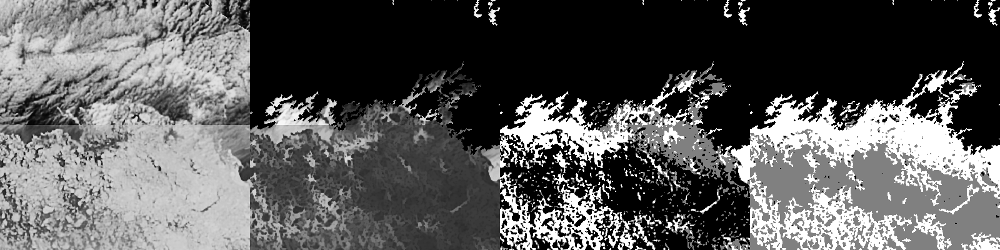

In [353]:
# This looks at binarization using the whole image, not tiles
# And it doesn't include checking if the data is bimodal
three_layer_from_gray = 0.5 .* binarize(complement.(enhanced_gray) .* .!cloud_mask, Otsu()) .+
                        0.5 .* binarize(complement.(enhanced_gray) .* .!cloud_mask, AdaptiveThreshold(;window_size=tile_size_pixels, percentage=0))
three_layer_from_reconstruct = 0.5 .* binarize(reconstructed_complement .* .!cloud_mask, Otsu()) .+
                                0.5 .* binarize(reconstructed_complement .* .!cloud_mask, AdaptiveThreshold(;window_size=tile_size_pixels, percentage=0))
mosaicview(enhanced_gray, reconstructed_complement .* .! cloud_mask, three_layer_from_gray, three_layer_from_reconstruct, nrow=1)

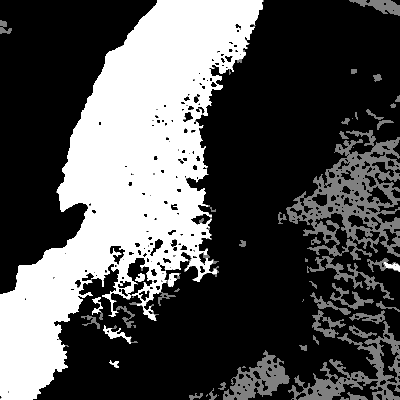

In [365]:
# And it doesn't include checking if the data is bimodal
three_layer_from_gray = 0.5 .* binarize(complement.(enhanced_gray), Otsu()) .+
                        0.5 .* binarize(complement.(enhanced_gray), AdaptiveThreshold(;window_size=tile_size_pixels, percentage=0))
three_layer_from_reconstruct = 0.5 .* binarize(reconstructed_complement, Otsu()) .+
                                0.5 .* binarize(reconstructed_complement, AdaptiveThreshold(;window_size=tile_size_pixels, percentage=0))


In [360]:
case.name

"168-laptev_sea-100km-20210807-aqua-250m"

It's not yet clear to me at what stage to apply the cloud mask. Using the adaptive histogram equalization on cloudy images works well, but can introduce artifacts. So one conservative approach could be to go ahead and segment the images, but to use matches across clear sky to cloudy images as a prerequisite for using the ice floes. In some of the cases, it seems like doing the morphological operations with the (equalized) clouds retained in the image works better. E.g. case 67.

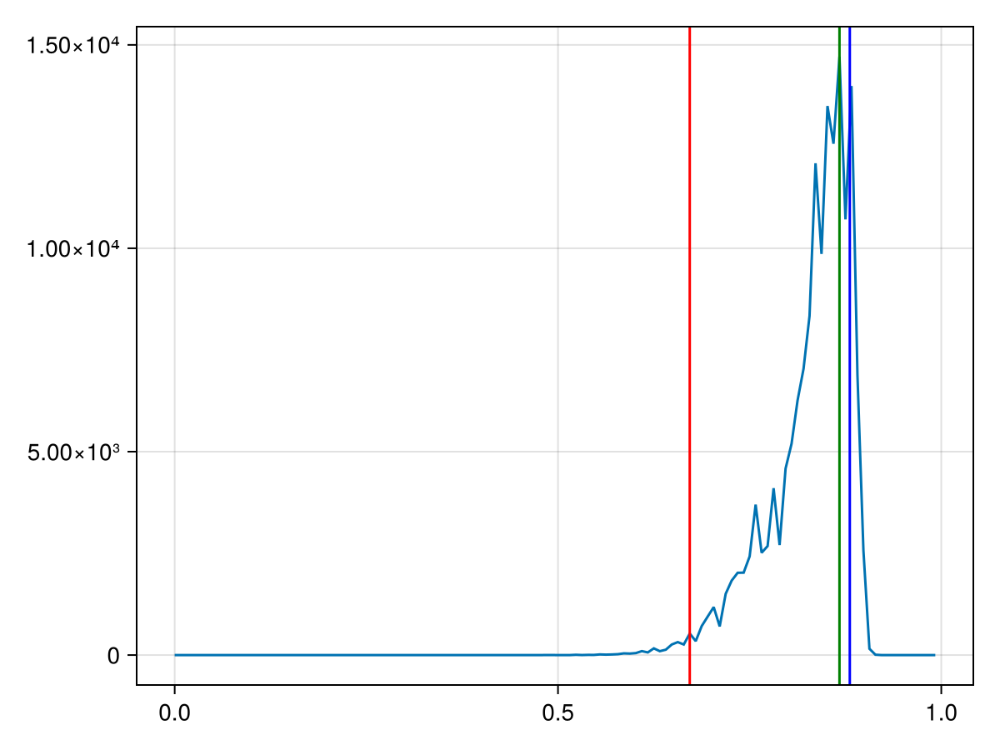

In [276]:
# One method we could use is to find the peaks and then stretch the image. 
# But that may be overkill.
pks = findmaxima(bin_counts, window) |> peakproms! |> peakwidths!
pks_df = DataFrame(pks[Not(:data)])
pks_df = sort(pks_df, :proms, rev=true)
mx, argmx = findmax(pks_df.proms)
bright_peak = edges[pks_df[argmx, :indices]]
pct05 = percentile(vec(img), 5)
pct95 = percentile(vec(img), 95)
new_max = mean([bright_peak, pct95])

gray_brightest = adjust_histogram(img, LinearStretching((0, bright_peak) => (0, 1)))
gray_midpoint = adjust_histogram(img, LinearStretching((pct05, new_max) => (0, 1)))

lines(edges, bin_counts[1:end])
vlines!([new_min, new_max, bright_peak], color=[:red, :blue, :green])
current_figure()

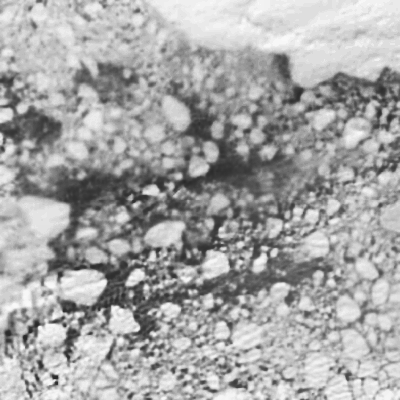

In [332]:
adjust_histogram(img, AdaptiveEqualization(clip=0.75, rblocks=rblocks, cblocks=cblocks, nbins=256))

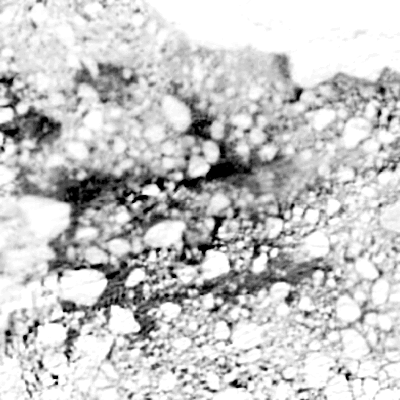

In [300]:
stretched_img = adjust_histogram(img, LinearStretching((new_min, new_max) => (0, 1)))

stretched_img2 = IceFloeTracker.skimage.sk_exposure.rescale_intensity(round.(Int64, Float64.(img) .* 255), in_range=(new_min * 255, new_max * 255), out_range=(0, 255))
stretched_img2 = Gray.(stretched_img2 ./ 255)

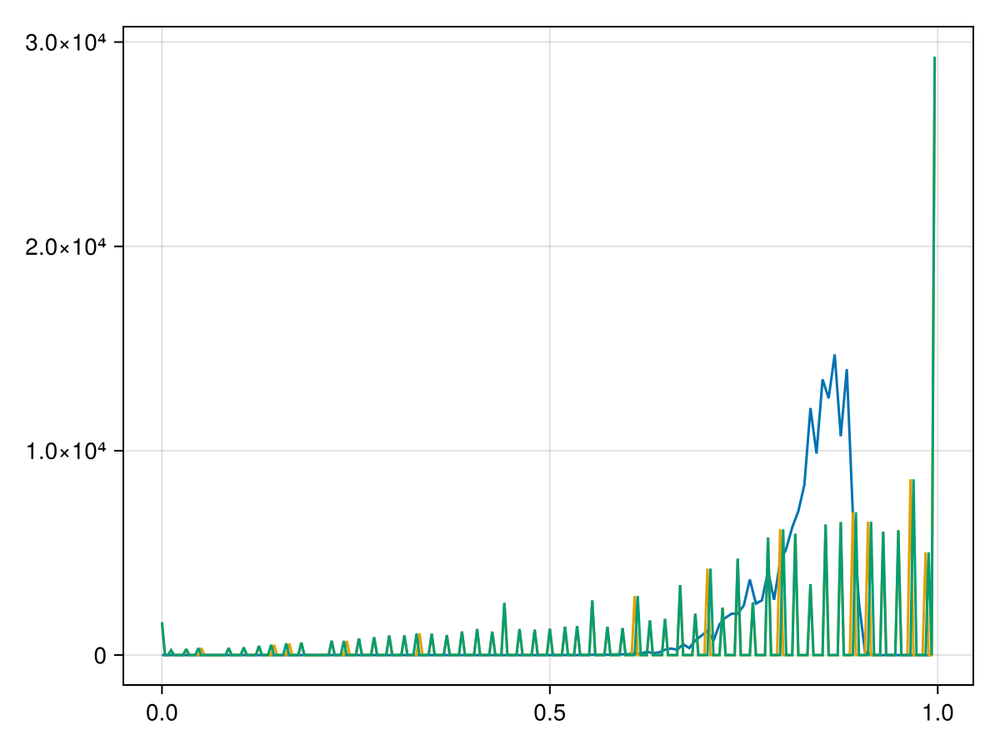

In [305]:
edges, bin_counts = build_histogram(img, 128; minval=0, maxval=1)
lines(edges, bin_counts[1:end])

edges, bin_counts = build_histogram(stretched_img, 256; minval=0, maxval=1)
lines!(edges, bin_counts[1:end])

edges, bin_counts = build_histogram(stretched_img2, 256; minval=0, maxval=1)
lines!(edges, bin_counts[1:end])

current_figure()

In [114]:
length(edges)

128

# Some alternatives at this point:
- Otsu binarization -- used a lot with sea ice, assumes bimodal distribution (so we could check for that first)
- Adaptive threshold binarization -- used in Ellen's paper, better at finding local bright patches.

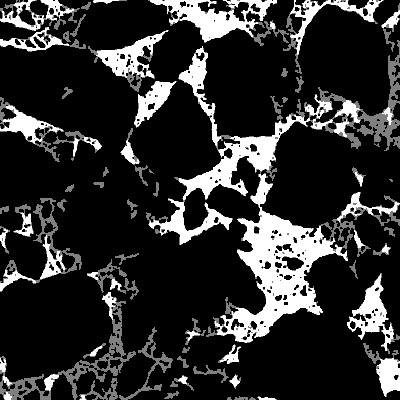

[ Info: Darkening water and insterstitial ice in morphological result


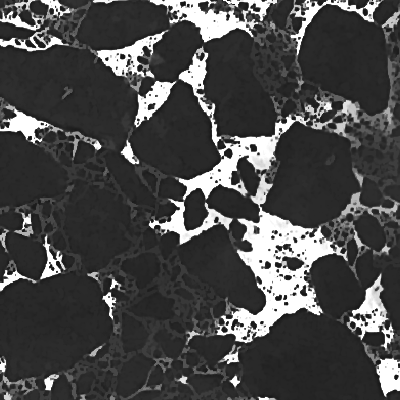

In [76]:
@info "Darkening water and insterstitial ice in morphological result"
# cast to float to avoid issues with N0f8 integer rollover
reconstructed_complement .= float64.(reconstructed_complement)
init_green = float64.(green.(tc_img))
# bright areas in the reconstructed complement are water and interstitial ice.
adjustment_mask = (reconstructed_complement .- init_green ) .> 0
reconstructed_complement[adjustment_mask] .=  clamp.(1.2 .* reconstructed_complement[adjustment_mask], 0, 1);
# clamp!(reconstructed_complement, 0, 1)
reconstructed_complement

[ Info: Finding peaks and linear stretching of morphological result


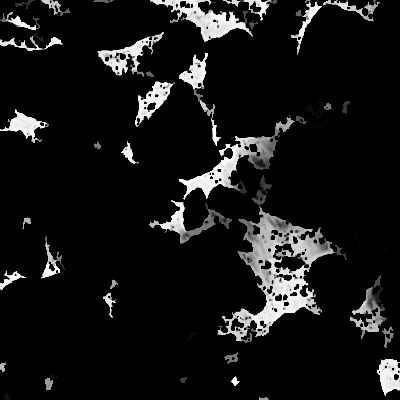

In [157]:
@info "Finding peaks and linear stretching of morphological result"
window=3
img = clamp.(Gray.(enhanced_gray) .- Gray.(reconstructed_complement), 0, 1)
edges, bin_counts = build_histogram(img, 64; minval=0, maxval=1)
pks = findmaxima(bin_counts, window) |> peakproms! |> peakwidths!
pks_df = DataFrame(pks[Not(:data)])
pks_df = sort(pks_df, :proms, rev=true)
mx, argmx = findmax(pks_df.proms)
new_min = edges[pks_df[argmx, :indices]]
new_max = percentile(vec(reconstructed_complement), 99)
new_max = 1
adjust_histogram!(reconstructed_complement,LinearStretching((new_min, new_max) => (0, 1)));
reconstructed_complement

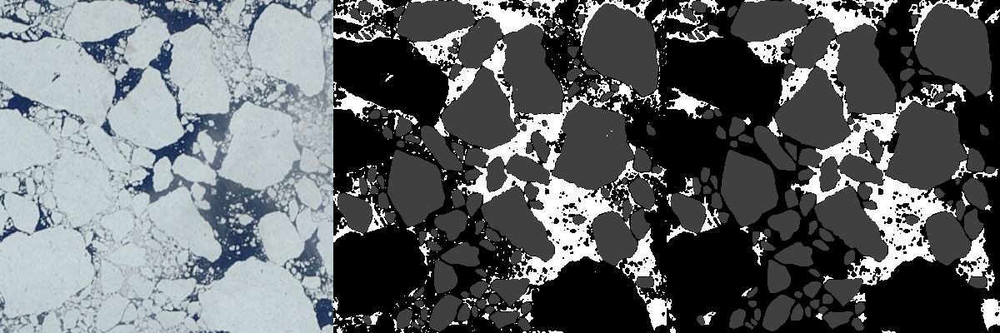

In [78]:
mosaicview(tc_img, complement.(binarize(tc_img, Otsu())) .+ 0.25 .* case.validated_binary_floes,
    Gray.(reconstructed_complement .> 0) .+ 0.25 .* case.validated_binary_floes, nrow=1)

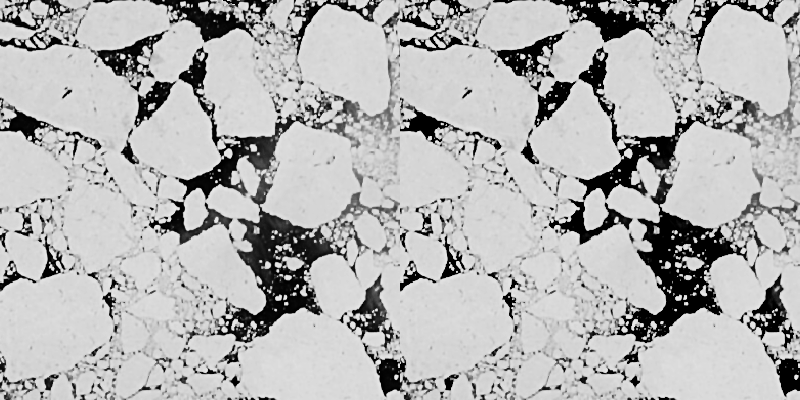

In [99]:
mosaicview(enhanced_gray, n0f8.(clamp.(float64.(enhanced_gray) .* complement.(reconstructed_complement), 0, 1)), nrow=1)

0.828125

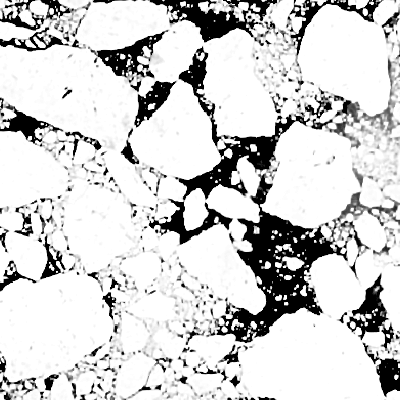

In [162]:
window=3
img = clamp.(float64.(enhanced_gray) .- float64.(reconstructed_complement), 0, 1)
edges, bin_counts = build_histogram(img, 64; minval=0, maxval=1)
pks = findmaxima(bin_counts, window) |> peakproms! |> peakwidths!
pks_df = DataFrame(pks[Not(:data)])
pks_df = sort(pks_df, :proms, rev=true)
mx, argmx = findmax(pks_df.proms)
new_max = edges[pks_df[argmx, :indices]]
print(new_max)
test_img = adjust_histogram(img, LinearStretching((0, new_max) => (0, 1)))
adjust_histogram!(img, LinearStretching((0.15, new_max) => (0, 1)))
Gray.(img)

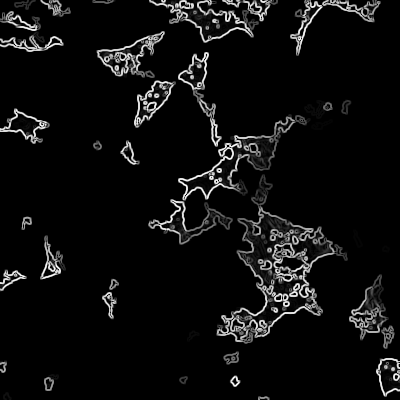

In [164]:
Gx, Gy = imgradients(reconstructed_complement,  KernelFactors.sobel, "replicate")
gmag = hypot.(Gx, Gy)
for tile in tiles
    gmag[tile...] .= gmag[tile...] ./ maximum(gmag[tile...]) # local max, smoothed?
end
Gray.(gmag)

In [139]:
# local_max = ImageMorphology.local_maxima(reconstructed_complement; connectivity=1) .> 0;
# Gray.(local_max)

In [165]:
using Random

# Produce an image by replacing values inside a segment with the segment mean color
function view_seg(s)
    map(i->segment_mean(s,i), labels_map(s))
end
# Return a random color of type RGB{N0f8}
function get_random_color(seed)
    Random.seed!(seed)
    rand(RGB{N0f8})
end

# Assign random colors to each segment (useful if viewing cluster results)
function view_seg_random(s)
    map(i->get_random_color(i), labels_map(s))
end


view_seg_random (generic function with 1 method)

In [166]:
# Function for stitching segments accross tile boundaries
include("../scripts/dev/segmentation.jl")

stitch_clusters (generic function with 3 methods)

In [170]:
test_img = Gray.(deepcopy(img))
segments = zeros(Int64, size(tc_img))
k = 4
idx = 0
for tile in tiles
    # This is pretty fast by itself.
    # The question is whether it is better 
    segments[tile...] = IceFloeTracker.kmeans_segmentation(float64.(test_img[tile...]), k=k) .+ (idx*k)
    idx += 1
end

# quality metrics for k = 3, 4, 5?
# test of whether sea ice present in tile?

In [171]:
bin_img = tiled_adaptive_binarization(enhanced_gray, tiles;
    minimum_window_size=400, minimum_brightness=0.3 , threshold_percentage=0);
tc_seg = SegmentedImage(tc_img, label_components(segments))
tc_seg_stitched = SegmentedImage(tc_img, label_components(stitch_clusters(tiles, tc_seg)))
bdry_seg = SegmentedImage(gmag, tc_seg_stitched.image_indexmap)
local_max_seg = SegmentedImage(bin_img, tc_seg_stitched.image_indexmap)
gray_seg = SegmentedImage(enhanced_gray, tc_seg_stitched.image_indexmap)

Segmented Image with:
  labels map: 400×400 Matrix{Int64}
  number of labels: 6103

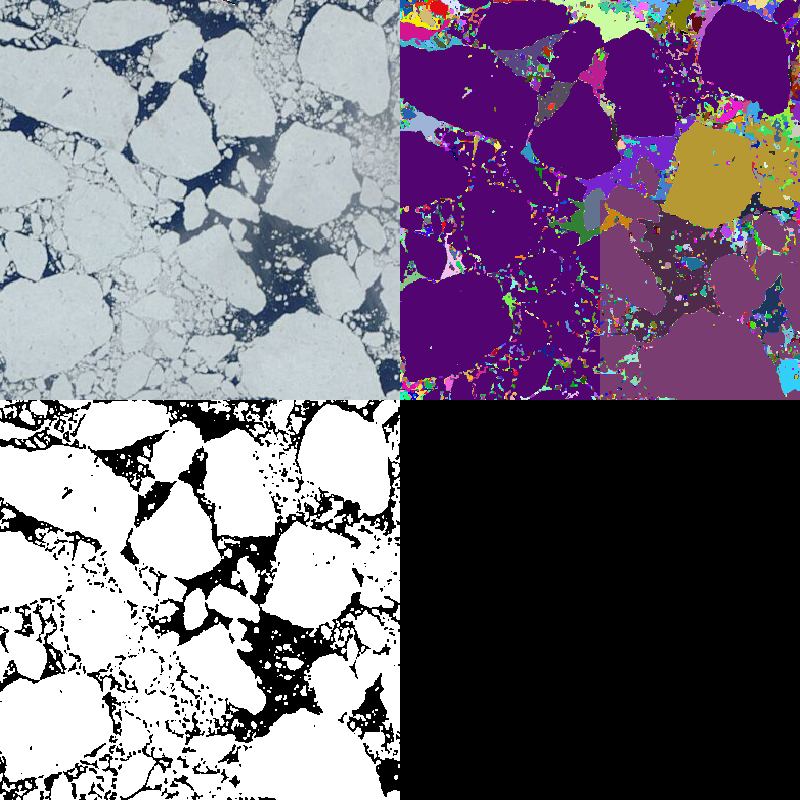

In [172]:
mosaicview(tc_img, bin_img, view_seg_random(tc_seg_stitched) .* .! cloud_mask, Gray.(cloud_mask), nrow=2)

In [173]:
# Categories: 
# Water (tc_img mean red channel l

# Remove segments if they are more than 10 percent boundary pixels and they are smaller than 10 pixels
rem_labels = [s for s in bdry_seg.segment_labels if (bdry_seg.segment_means[s] > 0.1 && bdry_seg.segment_pixel_count[s] < 10)];

In [174]:
# Keep labels if they are more than 50% bright ice pixels and larger than 10 pixels
keep_labels = [s for s in segment_labels(gray_seg)
                    if segment_mean(gray_seg, s) > 0.5 && 
                       segment_pixel_count(gray_seg, s) > 64];

In [175]:
length(rem_labels)
diff_fn(rlab, nlab) = segment_mean(bdry_seg, nlab) - segment_mean(bdry_seg, rlab);
new_seg = prune_segments(bdry_seg, rem_labels, diff_fn);

new_map = zeros(Int64, size(gray_seg.image_indexmap))
for ii in keep_labels
    idx = gray_seg.image_indexmap .== ii
    new_map[idx] .= ii
end
new_map .= new_map .* .! cloud_mask

small_objects = zeros(Int64, size(gray_seg.image_indexmap))
for ii in keep_labels
    if segment_pixel_count(gray_seg, ii) < 64
        idx = gray_seg.image_indexmap .== ii 
        small_objects[idx] .= ii
    end
end
test_seg_1 = SegmentedImage(bin_img, new_seg.image_indexmap)
test_seg_2 = SegmentedImage(bin_img, new_map)

Segmented Image with:
  labels map: 400×400 Matrix{Int64}
  number of labels: 28

What's in the watershed function:
```
    seg = -IceFloeTracker.bwdist(.!bw)
    mask2 = imextendedmin(seg)
    seg = impose_minima(seg, mask2)
    cc = label_components(imregionalmin(seg), trues(3, 3))
    w = ImageSegmentation.watershed(seg, cc)
    lmap = labels_map(w)
    return Images.isboundary(lmap) .> 0
```

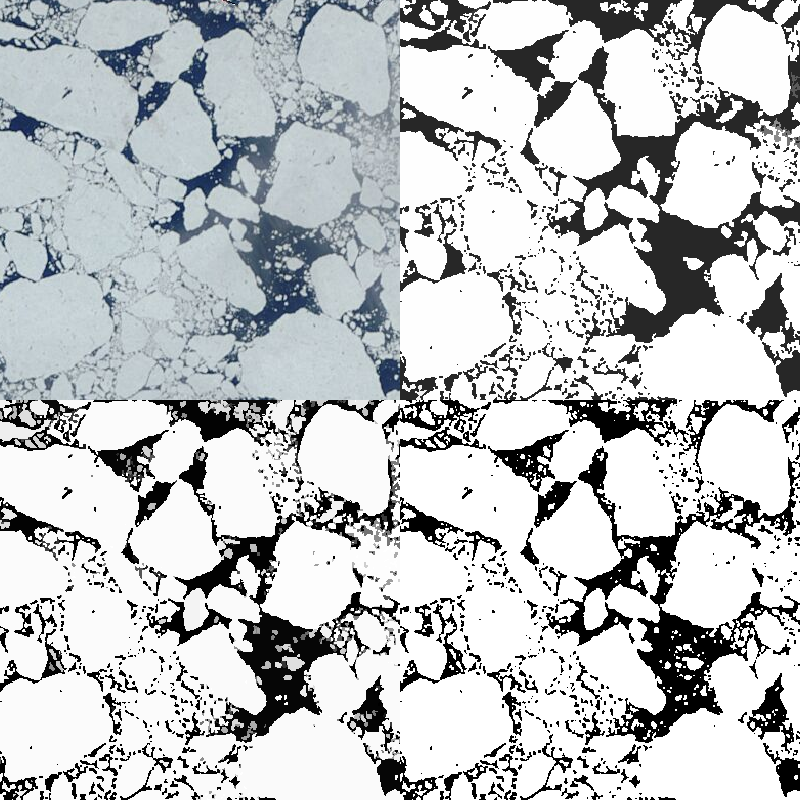

In [178]:
test_img = view_seg(test_seg_1)
# test_img[test_seg.image_indexmap .== 0] .= 0
# test_img[local_max .> 0] .= 0
mosaicview(tc_img, view_seg(test_seg_1), view_seg(test_seg_2), Gray.(bin_img), nrow=2)

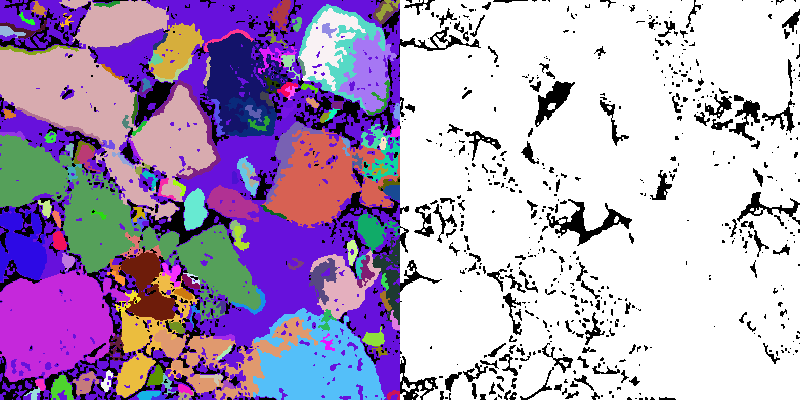

In [179]:
local_min = ImageMorphology.local_minima(test_img; connectivity=1) .> 0;
mosaicview(view_seg_random(test_seg) .* .!local_min, Gray.(.!local_min), nrow=1)

Left: Result of k-means and lots of pruning steps. Right: simple adaptive binary threshold

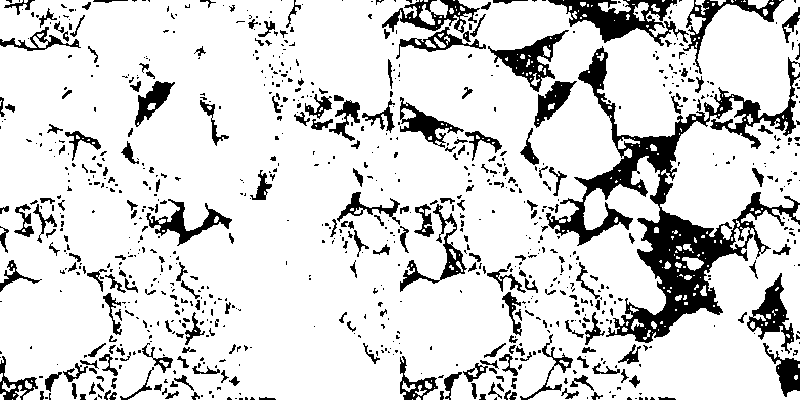

In [180]:

prelim_icemask = Gray.(view_seg_random(test_seg) .* .!local_min) .> 0
print("Left: Result of k-means and lots of pruning steps. Right: simple adaptive binary threshold")
mosaicview(Gray.(prelim_icemask), Gray.(bin_img .* .! cloud_mask), nrow=1)

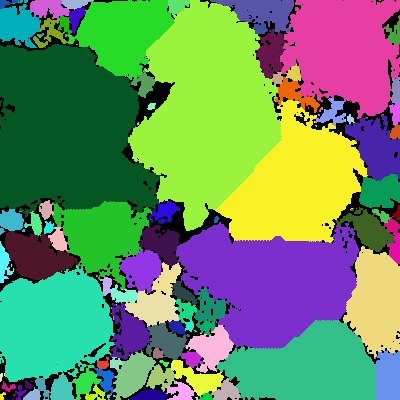

In [188]:
bw = deepcopy(prelim_icemask)
IceFloeTracker.fillholes!(bw)
seg = -IceFloeTracker.bwdist(.!bw)
mask2 = IceFloeTracker.imextendedmin(seg)
seg = IceFloeTracker.impose_minima(seg, mask2)
cc = SegmentedImage(bin_img, label_components( IceFloeTracker.imregionalmin(seg), trues(3, 3)))
w1 = ImageSegmentation.watershed(seg, cc.image_indexmap)
stage_one = view_seg_random(w1) .* bw
# mosaicview(0.5 .* Gray.(bw) .+ 0.5 .* view_seg_random(cc), 
#     0.5 .* Gray.(bw) .+ 0.5 .*view_seg_random(w1), stage_one,
#     0.75 .* img .+ 0.5 .* stage_one, nrow=2)

In [186]:
regional_min_img = Gray.(IceFloeTracker.Morphology.imregionalmin(gmag))
X = view_seg(SegmentedImage(regional_min_img, w.image_indexmap .* bw))

LoadError: UndefVarError: `w` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

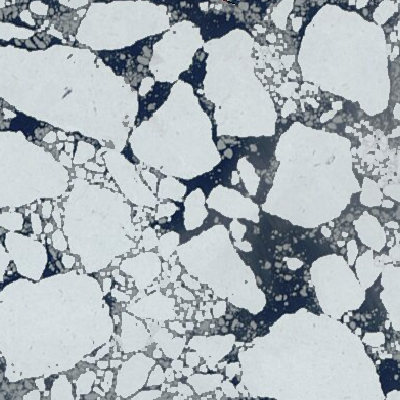

In [381]:
mosaicview(0.75 .* tc_img .+ 0.25 .* opening(Gray.(bw)), nrow=1)

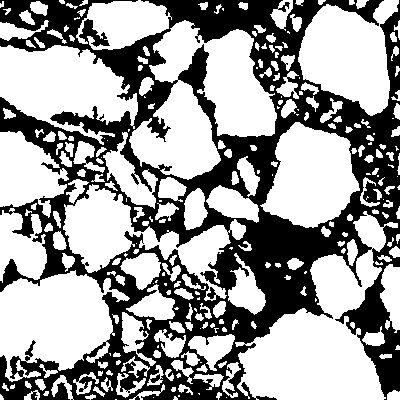

In [394]:
morph_residue = deepcopy(img) .* .! cloud_mask
se_init = collect(strel_diamond((5,5)))
se_box = collect(strel_box((3, 3))) # default strel from sk_morphology
mr_reconst = mreconstruct(dilate,
                          erode(morph_residue, se_init),
                          morph_residue,
                          se_box)
mr_reconst .= complement.(mreconstruct(dilate,
                                complement.(dilate(mr_reconst, se_octagon)), 
                                complement.(mr_reconst),
                                se_box))
local_max = ImageMorphology.local_maxima(mr_reconst; connectivity=1) .> 0
# local_max .= erode(local_max, strel_diamond((3,3)))

# local_max .= IceFloeTracker.branchbridge(local_max)
# IceFloeTracker.hbreak!(local_max)
Gray.(local_max)

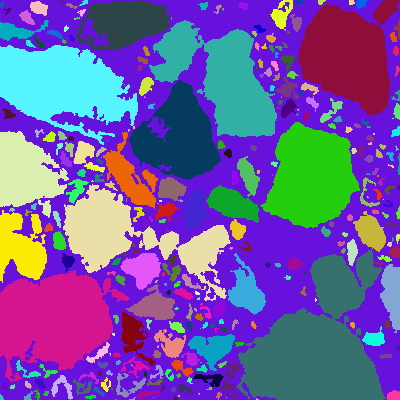

In [383]:
view_seg_random(SegmentedImage(tc_img, label_components(local_max))) # connectivity choice here?

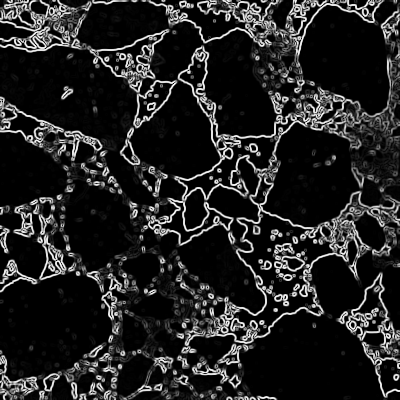

In [426]:
mr_equalized = adjust_histogram(morph_residue, Equalization(nbins = 256, minval = 0, maxval = 1))
Gx, Gy = imgradients(morph_residue,  KernelFactors.sobel, "replicate")
gmag = hypot.(Gx, Gy)
gmag .= gmag ./ maximum(gmag)
Gray.(gmag)

In [427]:
minimamarkers = opening(local_max) #.| segment_mask .| ice_mask
gmag .= IceFloeTracker.impose_minima(gmag, minimamarkers)
cc = label_components(IceFloeTracker.imregionalmin(gmag), trues(3, 3))
w2 = ImageSegmentation.watershed(morph_residue, cc)

Segmented Image with:
  labels map: 400×400 Matrix{Int64}
  number of labels: 290

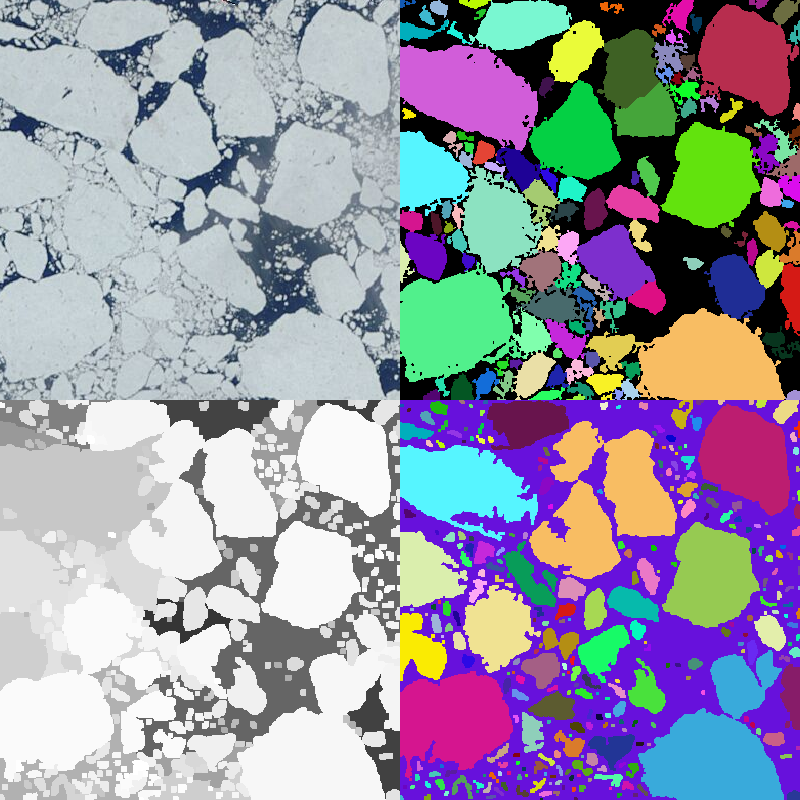

In [428]:
mosaicview(tc_img, view_seg(w2), stage_one, view_seg_random(SegmentedImage(morph_residue, cc)), nrow=2)

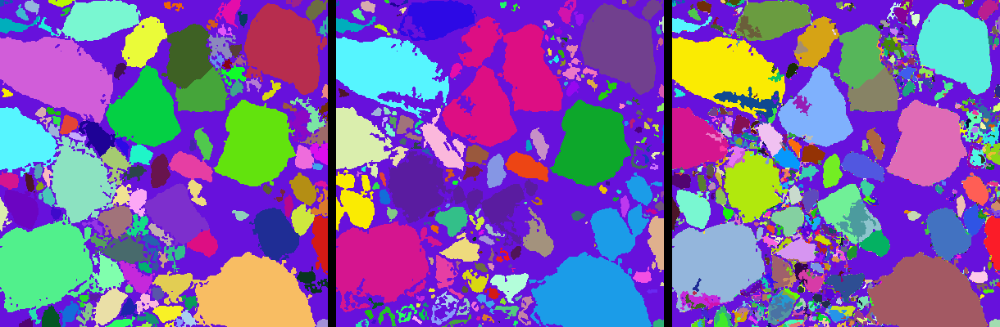

In [387]:
w2_idx = SegmentedImage(morph_residue, cc).image_indexmap
w2_idx .= w2_idx .* bw
w1_idx = w1.image_indexmap .* bw
mosaicview(view_seg_random(SegmentedImage(morph_residue, w1_idx )), 
    view_seg_random(SegmentedImage(morph_residue, w2_idx)),
    view_seg_random(SegmentedImage(morph_residue, label_components(w1_idx .+ w2_idx))), nrow=1, npad=10) 

In [429]:
joined_seg = SegmentedImage(morph_residue, label_components(w1_idx .+ w2_idx))
RAG = region_adjacency_graph(joined_seg)

LoadError: MethodError: no method matching region_adjacency_graph(::SegmentedImage{Matrix{Int64}, Gray{Float32}})
The function `region_adjacency_graph` exists, but no method is defined for this combination of argument types.

[0mClosest candidates are:
[0m  region_adjacency_graph(::SegmentedImage, [91m::Function[39m)
[0m[90m   @[39m [35mImageSegmentation[39m [90m~/.julia/packages/ImageSegmentation/T47s5/src/[39m[90m[4mcore.jl:122[24m[39m
[0m  region_adjacency_graph([91m::AbstractArray{CT, N}[39m, [91m::Function[39m, [91m::Int64[39m) where {CT<:Union{Real, Colorant}, N}
[0m[90m   @[39m [35mImageSegmentation[39m [90m~/.julia/packages/ImageSegmentation/T47s5/src/[39m[90m[4mcore.jl:417[24m[39m
[0m  region_adjacency_graph([91m::AbstractArray{CT, N}[39m, [91m::Function[39m, [91m::CartesianIndex{N}[39m) where {CT<:Union{Real, Colorant}, N}
[0m[90m   @[39m [35mImageSegmentation[39m [90m~/.julia/packages/ImageSegmentation/T47s5/src/[39m[90m[4mcore.jl:391[24m[39m


In [ ]:
IceFloeTracker.skimage

What we are looking at in the above image is two candidate segmentations using watershed transformations and morphological operations: the far left one is from the k-means processing (watershed1) and the center is from the morphological reconstruction method (watershed 2). On the right, we have a segmentation formed from intersecting both segmentation results. It is (apparently) a common approach to oversegment, then to find the pieces of the puzzle that stay together across multiple segmentation approaches. We can see that there is disagreement at the boundaries, and that there are some floes that are more aggressively segmented in one method than in the other. By and large though, the intersection appears to be better than the individual results in most cases.

What techniques do others use to find the best segmentation result from static images?

Some ideas:
* Does the object stay connected after X number of erosions? If not, relabel and regrow
* Another watershed method, using the skeletonization https://stackoverflow.com/questions/22791333/determining-bottleneck-image-regions-using-scipy 



In [403]:
skel = Images.thinning(local_max);

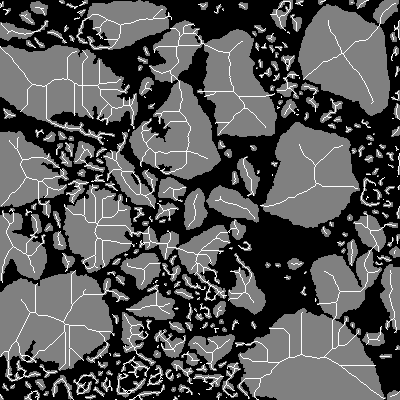

In [404]:
Gray.(local_max .* 0.5 .+ skel)

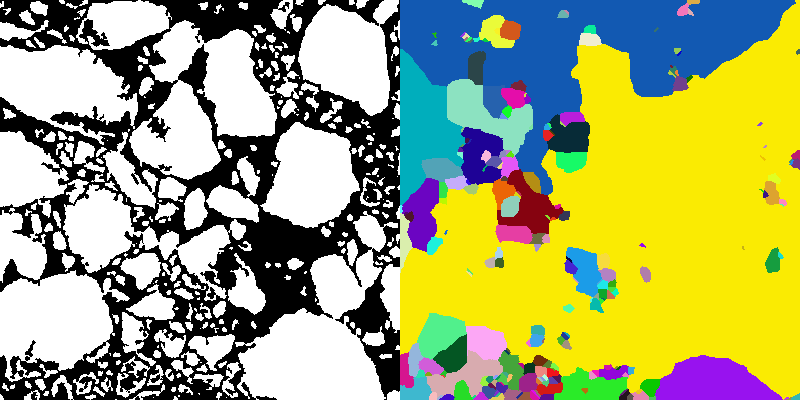

In [423]:
dist_skel = IceFloeTracker.bwdist(skel) .> 3
w = watershed(skel, label_components(dist_skel))
mosaicview(Gray.(local_max), view_seg_random(w), ncol=2)

So what we have so far is
- kmeans to get potential image segments
- gradients to get the boundary pixels and remove those from consideration
- fraction of bright ice pixels to get possible ice floes

Next, I want to
- check each floe on whether it is foreground or background by comparing the mean brightness to the brightness of it's boundary. So that could be done by grabbing the object, padding it, selecting the enhanced grayscale image intersecting with the dilated padded object, and checking if it is at least some threshold brighter. If not, call it background.
- Fill holes based on a distance transform method. A melt pond in the center of a floe, for example, is a dark patch with no neighbors nearby. So we could use a region adjacency graph to look for segments with only one neighbor.
- Then use the watershed segmentation to separate large floes.

Question: what would be the right way to merge floes together again?

Clockwise from top left: True color, gradients averaged in segments, fraction of binarized image within floes, random colors of the stitched TC seg, segment colors for the grayscale seg, and random colors after pruning boundaries.

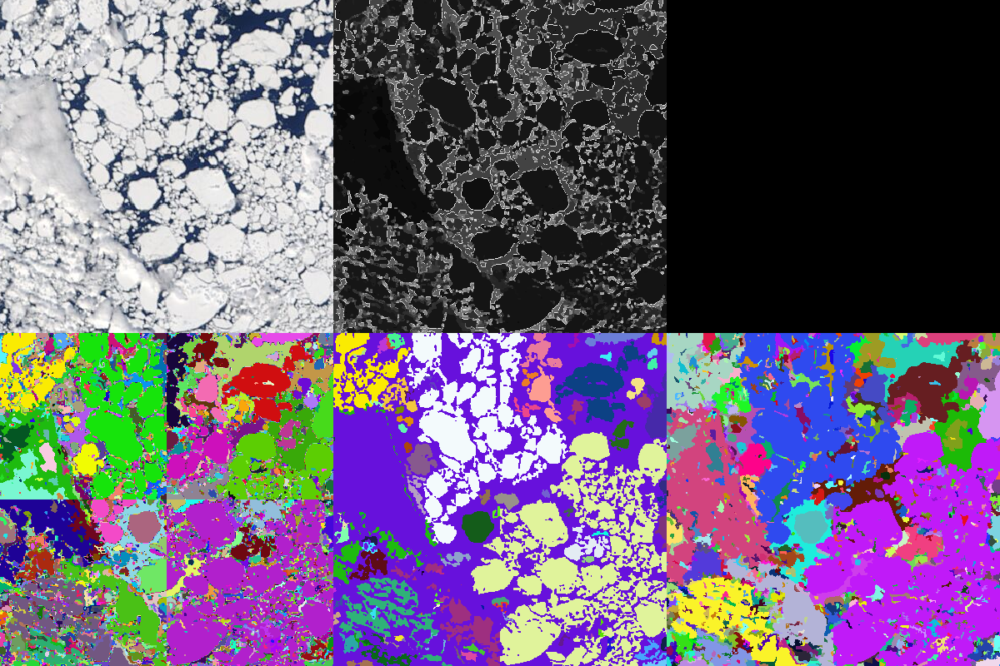

In [301]:
print("Clockwise from top left: True color, gradients averaged in segments, fraction of binarized image within floes, random colors of the stitched TC seg, segment colors for the grayscale seg, and random colors after pruning boundaries.")
mosaicview(tc_img, view_seg_random(tc_seg), view_seg(bdry_seg),
            view_seg_random(test_seg) .* .! (small_objects .> 0), Gray.(small_objects .> 0), view_seg_random(new_seg), nrow=2)

If we consider the distance to objects of a different type, we can use that information to distinguish between shadows and melt points within large floes vs the bits of noisy boundary fragments in the interstitial ice. 

In [302]:
length(keep_labels)

93

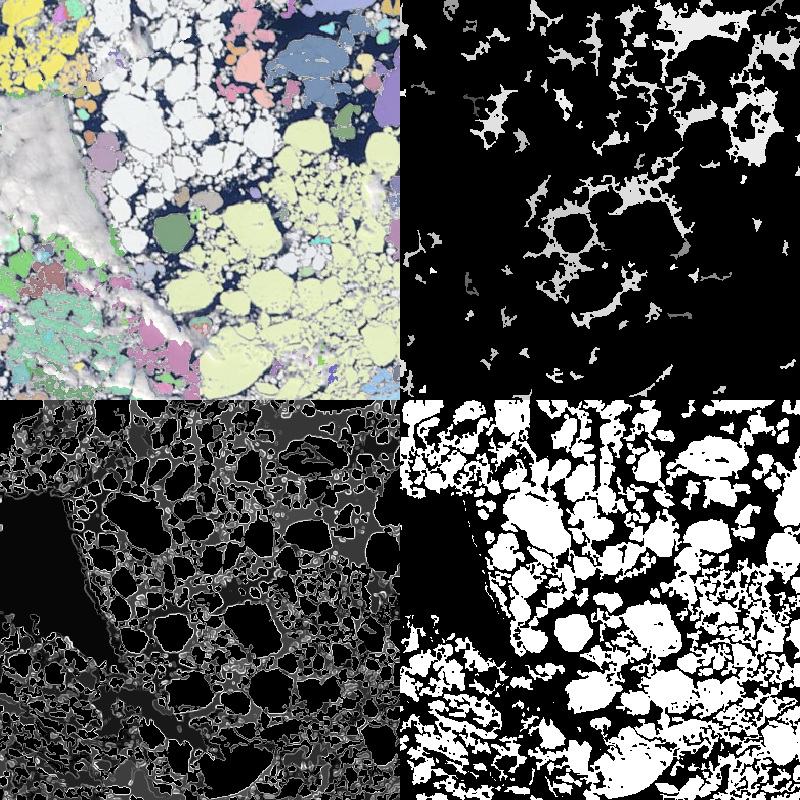

In [303]:
tc_img_cp = deepcopy(tc_img)
test_overlay = view_seg_random(test_seg) .* (new_map .!= 0)
tc_img_cp[new_map .!= 0] .= 0.5 .* test_overlay[new_map .!= 0] .+ 0.5 .* tc_img_cp[new_map .!= 0]
mosaicview(tc_img_cp, gmag, view_seg(local_max_seg), Gray.(test_seg.image_indexmap .> 0) .- 0.5 .* view_seg(local_max_seg),  nrow=2)

So - does the segmentation help us more than the binarization does? What can I do with the edge gradient information? Tag and watershed? Use Ellen's / Alexis' method?

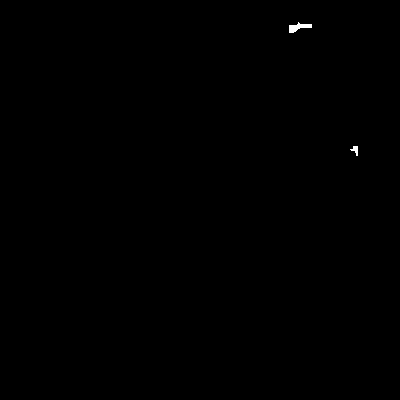

In [304]:
Gray.(IceFloeTracker.erode(view_seg(local_max_seg) .> 0.9, strel_box((15,15))))

In [305]:
length(segment_labels(new_seg))

1283

In [306]:
rem_labels = [s for s in segment_labels(new_seg) if segment_pixel_count(new_seg, s) < 64]
diff_fn(rlab, nlab) = segment_mean(gray_seg, nlab) - segment_mean(gray_seg, rlab)
new_seg2 = prune_segments(bdry_seg, rem_labels, diff_fn);

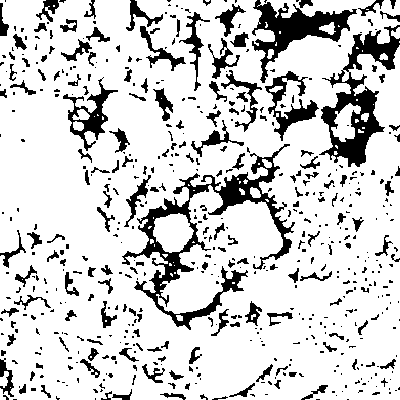

In [307]:
Gray.(view_seg(gray_seg) .> 0.5)

In [308]:
mosaicview(tc_gray,
    view_seg_random(tc_seg_stitched), view_seg(new_seg2), view_seg_random(new_seg2) .* (view_seg(bdry_seg) .< 0.5), nrow=2)

LoadError: UndefVarError: `tc_gray` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

[ Info: Precompiling IJuliaExt [2f4121a4-3b3a-5ce6-9c5e-1f2673ce168a] (cache misses: wrong dep version loaded (4), incompatible header (14))


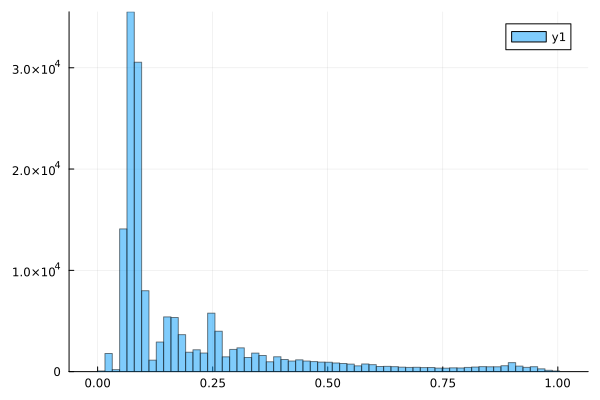

In [309]:
using Plots
histogram(vec(Float64.(Gray.(view_seg(bdry_seg)))), bins=range(0, 256, 64) ./ 255, alpha=0.5)

In [310]:
histogram(vec(Float64.(Gray.(tc_img))), bins=range(0, 256, 64) ./ 255, alpha=0.5)
histogram!(vec(Float64.(Gray.(tc_diffused_sharpened))), bins=range(0, 256, 64) ./ 255, alpha=0.5)
histogram!(vec(Float64.(Gray.(test))), bins=range(0, 256, 64) ./ 255, alpha=0.5)

LoadError: UndefVarError: `test` not defined in `Main`
Suggestion: check for spelling errors or missing imports.
Hint: a global variable of this name also exists in Pkg.

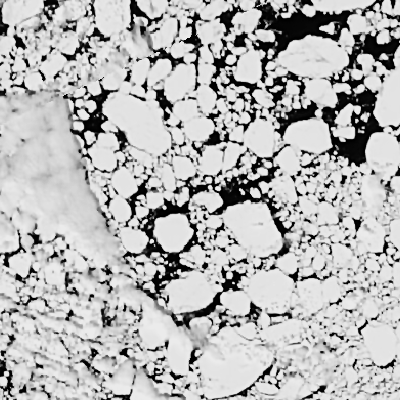

In [311]:
adjust_histogram(Gray.(tc_diffused_sharpened), ContrastStretching(slope=3.5))

In [312]:
tc_img = load("../../IceFloeTracker.jl/test/test_inputs/beaufort-chukchi-seas_truecolor.2020162.aqua.250m.tiff")
fc_img = load("../../IceFloeTracker.jl/test/test_inputs/beaufort-chukchi-seas_falsecolor.2020162.aqua.250m.tiff")
cloud_mask = IceFloeTracker.create_cloudmask(fc_img, new_cmask)
land_mask = IceFloeTracker.create_landmask(load("../../IceFloeTracker.jl/test/test_inputs/landmask.tiff"), strel_diamond((11,11)))
cloud_mask = cloud_mask .* land_mask.non_dilated;

LoadError: ArgumentError: No file exists at given path: ../../IceFloeTracker.jl/test/test_inputs/beaufort-chukchi-seas_truecolor.2020162.aqua.250m.tiff

In [313]:
tiles = IceFloeTracker.get_tiles(tc_img, 200)
tile_markers = zeros(size(cloud_mask))
filtered_tiles = filter(t -> filter_function(tc_img[t...], fc_img[t...], cloud_mask[t...], .!land_mask.dilated[t...]), tiles)
for tile in filtered_tiles
    tile_markers[tile...] .= 1
end

LoadError: UndefVarError: `filter_function` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [314]:
@time tc_diffused_sharpened_init = nonlinear_diffusion(deepcopy(tc_img), pmd_diff) |> unsharp_mask;

LoadError: UndefVarError: `unsharp_mask` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [315]:
@time begin
    tc_diffused_sharpened2 = deepcopy(tc_img)
    for tile in filtered_tiles
        tc_diffused_sharpened2[tile...] .= nonlinear_diffusion(deepcopy(tc_img)[tile...], pmd_diff) |> unsharp_mask
    end
end

LoadError: UndefVarError: `unsharp_mask` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [316]:
@time begin
    tc_diffused_sharpened = deepcopy(tc_img)
    for tile in tiles
        tc_diffused_sharpened[tile...] .= nonlinear_diffusion(deepcopy(tc_img)[tile...], pmd_diff) |> unsharp_mask
    end
end
nothing

LoadError: UndefVarError: `unsharp_mask` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [317]:
Gray.(abs.(tc_diffused_sharpened_init .- tc_diffused_sharpened))

LoadError: UndefVarError: `tc_diffused_sharpened_init` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [318]:
maximum(abs.(Float64.(Gray.(tc_diffused_sharpened_init)) .- Float64.(Gray.(tc_diffused_sharpened))))

LoadError: UndefVarError: `tc_diffused_sharpened_init` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [319]:
mosaicview(tc_diffused_sharpened_init, tc_diffused_sharpened, nrow=1)

LoadError: UndefVarError: `tc_diffused_sharpened_init` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [320]:
length(tiles), length(filtered_tiles)

(4, 4)

In [321]:
@time adjust_histogram(tc_diffused_sharpened, f)

LoadError: UndefVarError: `f` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

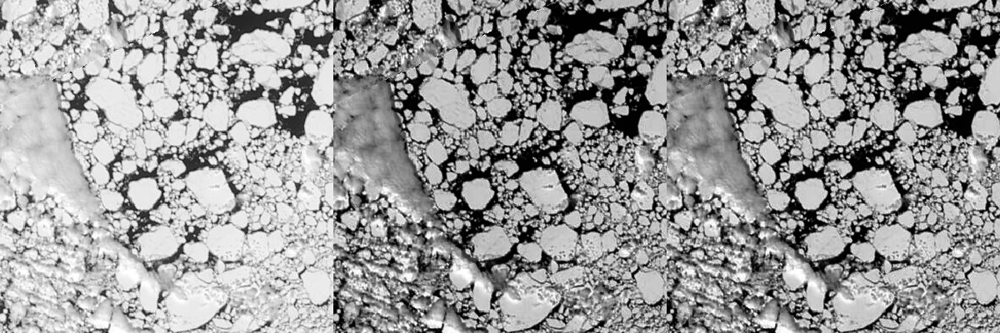

In [322]:
f = AdaptiveEqualization(;nbins=256, rblocks=8, cblocks=8, clip=0.99)
gc = GammaCorrection(gamma=3)
mosaicview(Gray.(tc_diffused_sharpened), adjust_histogram(Gray.(tc_diffused_sharpened), gc), 
    adjust_histogram(adjust_histogram(Gray.(tc_diffused_sharpened), gc), f), nrow=1)

In [323]:
# Reconstruction
# markers = closing(binarize(Gray.(tc_diffused_sharpened), AdaptiveThreshold(window_size=200, percentage=0)))
# reconstructed = mreconstruct(dilate, complement.(markers), complement.(Gray.(tc_diffused_sharpened)))
# # reconstructed = adjust_histogram(reconstructed, G())
# Gray.(tc_diffused_sharpened) .- reconstructed

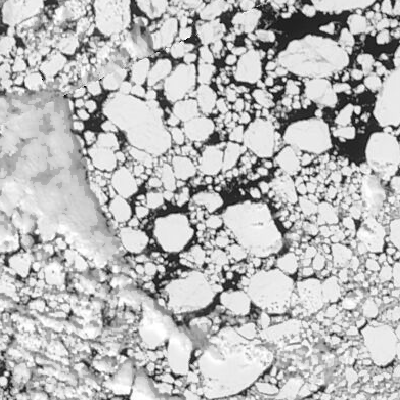

In [324]:
bin_img = opening(binarize(Gray.(tc_diffused_sharpened), AdaptiveThreshold(window_size=200, percentage=0)))
test = Gray.(tc_diffused_sharpened)
test[bin_img .== 0] .= 0.9 .* test[bin_img .== 0]
Gray.(test)

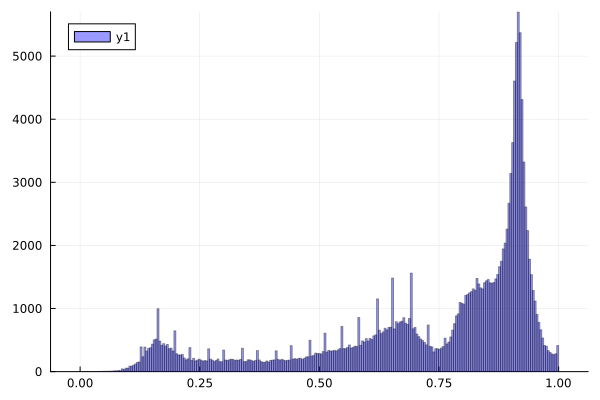

In [325]:
using Plots
bins = range(0, 1, 256)
histogram(vec(Float64.(test)), color=:blue, alpha=0.4, bins=bins)

# histogram!(vec(Float64.(adjust_histogram(Gray.(tc_diffused_sharpened), f))), color=:red, alpha=0.4, bins=bins)